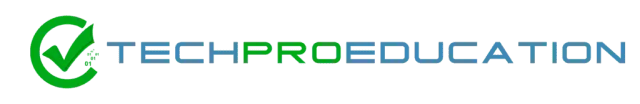

# Adult Income Prediction

**Data Set Information:**

This dataset was obtained from UCI Machine Learning Repository. The aim of this problem is to classify adults in two different groups based on their income where group 1 has an income less than USD 50k and group 2 has an income of more than or equal to USD 50k. The data available at hand comes from Census 1994.


**Attribute Information:**

Age: Describes the age of individuals. Continuous.

Workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

fnlwgt: Continuous.

education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

education-num: Number of years spent in education. Continuous.

marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

sex: Female, Male.

capital-gain: Continuous.

capital-loss: Continuous.

hours-per-week: Continuous.

native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

salary: >50K,<=50K

# Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()


%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 6


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.metrics import plot_roc_curve, plot_precision_recall_curve, roc_auc_score, auc
from sklearn.metrics import roc_curve, average_precision_score, precision_recall_curve
from sklearn.preprocessing import  LabelEncoder


import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

# Exploratory Data Analysis and Visualization

In [2]:
df = pd.read_csv("adult.csv") 

In [3]:
df.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [4]:
def summary(df, pred=None):
    obs = df.shape[0]
    Types = df.dtypes
    Counts = df.apply(lambda x: x.count())
    Min = df.min()
    Max = df.max()
    Uniques = df.apply(lambda x: x.unique().shape[0])
    Nulls = df.apply(lambda x: x.isnull().sum())
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        str = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    str.columns = cols
    print('___________________________\nData Types:')
    print(str.Types.value_counts())
    print('___________________________')
    return str

summary(df)

Data shape: (32561, 15)
___________________________
Data Types:
object    9
int64     6
Name: Types, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
age,int64,32561,73,0,17,90
capital.gain,int64,32561,119,0,0,99999
capital.loss,int64,32561,92,0,0,4356
education,object,32561,16,0,10th,Some-college
education.num,int64,32561,16,0,1,16
fnlwgt,int64,32561,21648,0,12285,1484705
hours.per.week,int64,32561,94,0,1,99
income,object,32561,2,0,<=50K,>50K
marital.status,object,32561,7,0,Divorced,Widowed
native.country,object,32561,42,0,?,Yugoslavia


In [5]:
def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print('*' * 100)
    else:
        print("There are no duplicated observations in the dataset.")

In [6]:
duplicate_values(df)

Duplicate check...
There are 24 duplicated observations in the dataset.
24 duplicates were dropped!
****************************************************************************************************


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32537.0,38.585549,13.637984,17.0,28.0,37.0,48.0,90.0
fnlwgt,32537.0,189780.848511,105556.471009,12285.0,117827.0,178356.0,236993.0,1484705.0
education.num,32537.0,10.081815,2.571633,1.0,9.0,10.0,12.0,16.0
capital.gain,32537.0,1078.443741,7387.957424,0.0,0.0,0.0,0.0,99999.0
capital.loss,32537.0,87.368227,403.101833,0.0,0.0,0.0,0.0,4356.0
hours.per.week,32537.0,40.440329,12.346889,1.0,40.0,40.0,45.0,99.0


In [8]:
df.describe(include="object").T

,count,unique,top,freq
workclass,32537,9,Private,22673
education,32537,16,HS-grad,10494
marital.status,32537,7,Married-civ-spouse,14970
occupation,32537,15,Prof-specialty,4136
relationship,32537,6,Husband,13187
race,32537,5,White,27795
sex,32537,2,Male,21775
native.country,32537,42,United-States,29153
income,32537,2,<=50K,24698


## Missing Value Control 

In [9]:
def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending = False)
    missing_percent = (df.isnull().sum() / df.isnull().count()).sort_values(ascending = False)
    missing_values = pd.concat([missing_number, missing_percent], axis = 1, keys = ['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number'] > 0]

In [10]:
missing_values(df)

,Missing_Number,Missing_Percent


In [11]:
df.replace(to_replace='?',value=np.nan,inplace=True)

#df=df.applymap(lambda x: np.nan if x=='?' else x)

In [12]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
workclass,1836,0.056428
native.country,582,0.017887


### workclass 

In [13]:
df['workclass'].value_counts(normalize=True)

Private             0.738510
Self-emp-not-inc    0.082733
Local-gov           0.068174
State-gov           0.042279
Self-emp-inc        0.036351
Federal-gov         0.031269
Without-pay         0.000456
Never-worked        0.000228
Name: workclass, dtype: float64

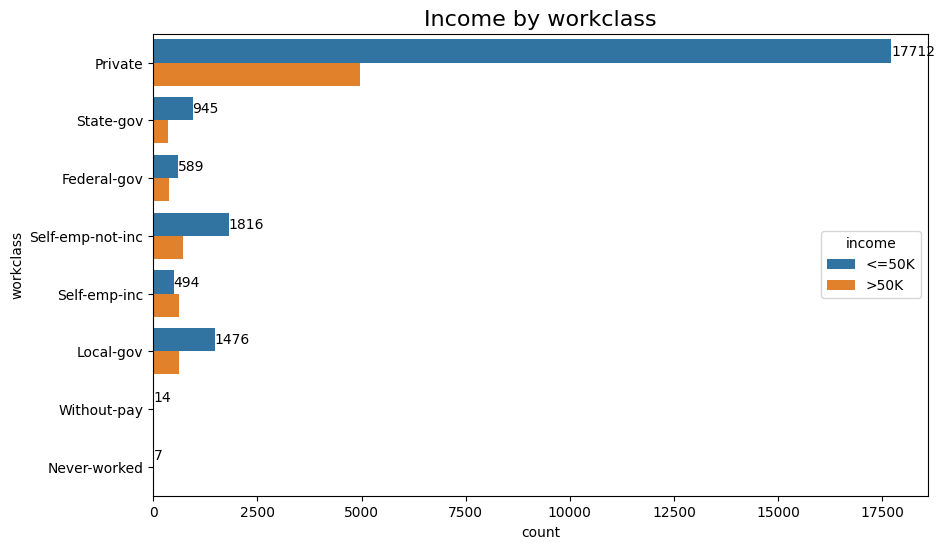

In [14]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['workclass'], hue = df['income'])
plt.title("Income by workclass", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [15]:
df['workclass'] = df['workclass'].fillna('Private')

In [16]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
native.country,582,0.017887


### occupation

In [17]:
df['occupation'].value_counts(normalize=True)

Prof-specialty       0.134749
Craft-repair         0.133381
Exec-managerial      0.132436
Adm-clerical         0.122760
Sales                0.118916
Other-service        0.107220
Machine-op-inspct    0.065159
Transport-moving     0.052030
Handlers-cleaners    0.044602
Farming-fishing      0.032319
Tech-support         0.030201
Protective-serv      0.021144
Priv-house-serv      0.004789
Armed-Forces         0.000293
Name: occupation, dtype: float64

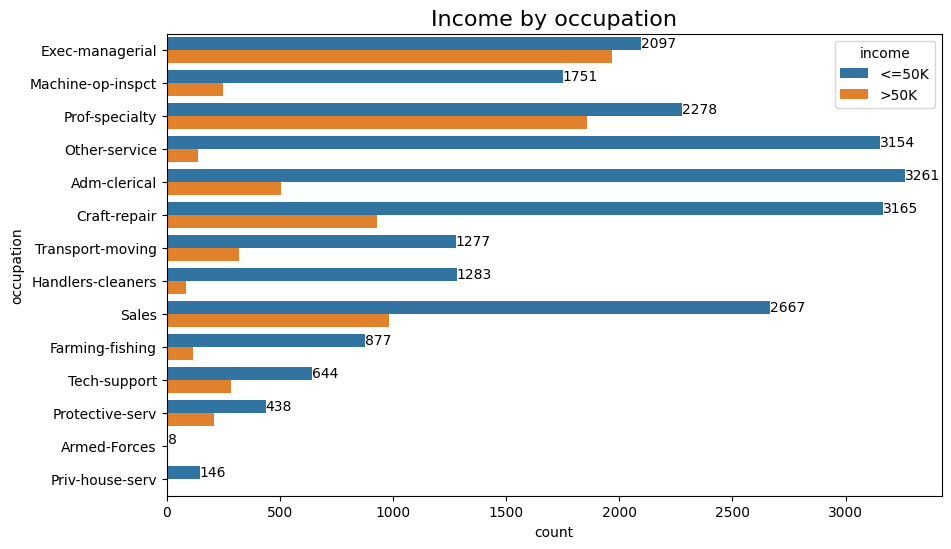

In [18]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['occupation'], hue = df['income'])
plt.title("Income by occupation", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [19]:
df['occupation'] = df['occupation'].fillna(method='bfill')

In [20]:
missing_values(df)

,Missing_Number,Missing_Percent
native.country,582,0.017887


### native country 

In [21]:
df['native.country'].value_counts(normalize=True)

United-States                 0.912314
Mexico                        0.019997
Philippines                   0.006196
Germany                       0.004287
Canada                        0.003787
Puerto-Rico                   0.003568
El-Salvador                   0.003317
India                         0.003129
Cuba                          0.002973
England                       0.002816
Jamaica                       0.002535
South                         0.002504
China                         0.002347
Italy                         0.002284
Dominican-Republic            0.002191
Vietnam                       0.002097
Guatemala                     0.001940
Japan                         0.001940
Poland                        0.001878
Columbia                      0.001846
Taiwan                        0.001596
Haiti                         0.001377
Iran                          0.001346
Portugal                      0.001158
Nicaragua                     0.001064
Peru                     

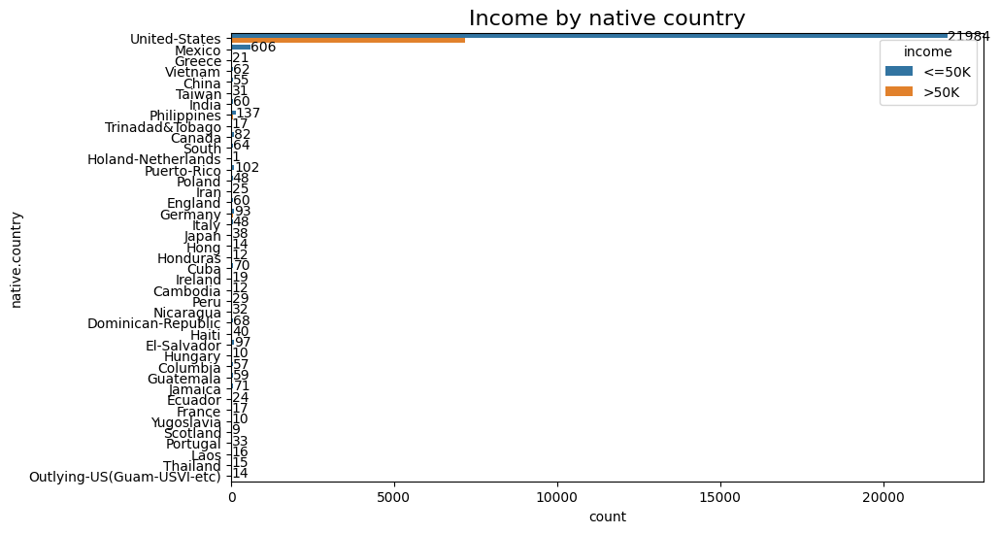

In [22]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['native.country'], hue = df['income'])
plt.title("Income by native country", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [23]:
df['native.country'] = df['native.country'].fillna('United-States')

In [24]:
missing_values(df)

,Missing_Number,Missing_Percent


## Target Variable

In [25]:
def value_cnt(df, column_name):
    vc = df[column_name].value_counts()
    vc_norm = df[column_name].value_counts(normalize=True)

    vc = vc.rename_axis('workclass').reset_index(name='counts')
    vc_norm = vc_norm.rename_axis('workclass').reset_index(name='norm_counts')

    df_result = pd.concat([vc['workclass'], vc['counts'], vc_norm['norm_counts']], axis=1)
    
    return df_result

In [26]:
print(df.income.value_counts())
print("---------------------")
print(df.income.value_counts(normalize=True))

<=50K    24698
>50K      7839
Name: income, dtype: int64
---------------------
<=50K    0.759074
>50K     0.240926
Name: income, dtype: float64


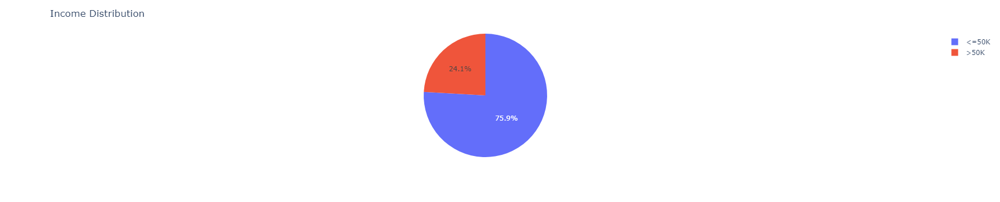

In [27]:
income_distr =df['income'].value_counts().reset_index()
fig = px.pie(income_distr, values='income', names='index')
fig.update_layout(title="Income Distribution")
fig.show()

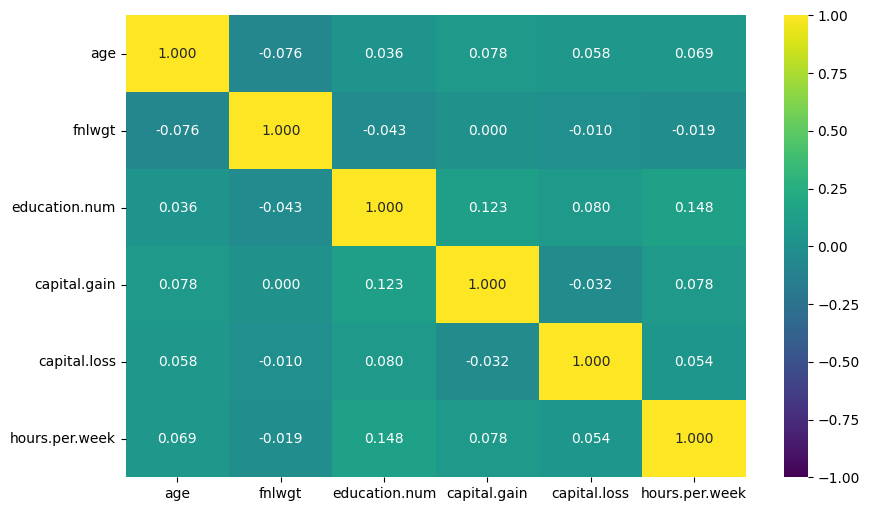

In [28]:
sns.heatmap(df.corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='viridis');

In [29]:
df['income']=df['income'].map({'<=50K': 0, '>50K': 1})

In [30]:
df.sample(5)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
15601,30,Private,158002,Some-college,10,Never-married,Craft-repair,Other-relative,White,Male,0,0,55,Ecuador,0
10503,31,Private,197672,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,0
3361,23,Private,211049,Some-college,10,Never-married,Tech-support,Not-in-family,White,Female,4101,0,40,United-States,0
24877,43,Self-emp-inc,82488,Bachelors,13,Married-civ-spouse,Sales,Own-child,Asian-Pac-Islander,Female,0,0,40,Philippines,1
22041,57,Self-emp-not-inc,275943,7th-8th,4,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,40,United-States,0


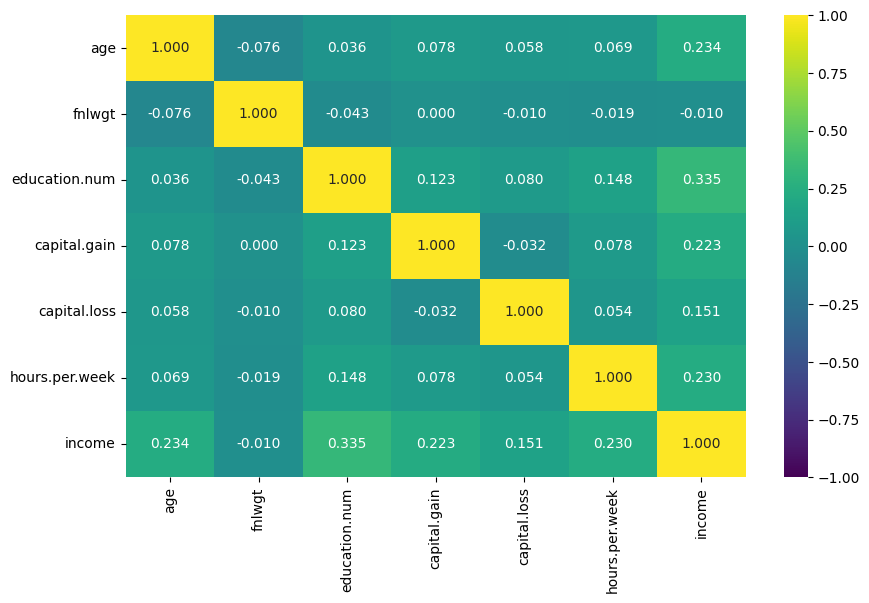

In [31]:
sns.heatmap(df.corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='viridis');

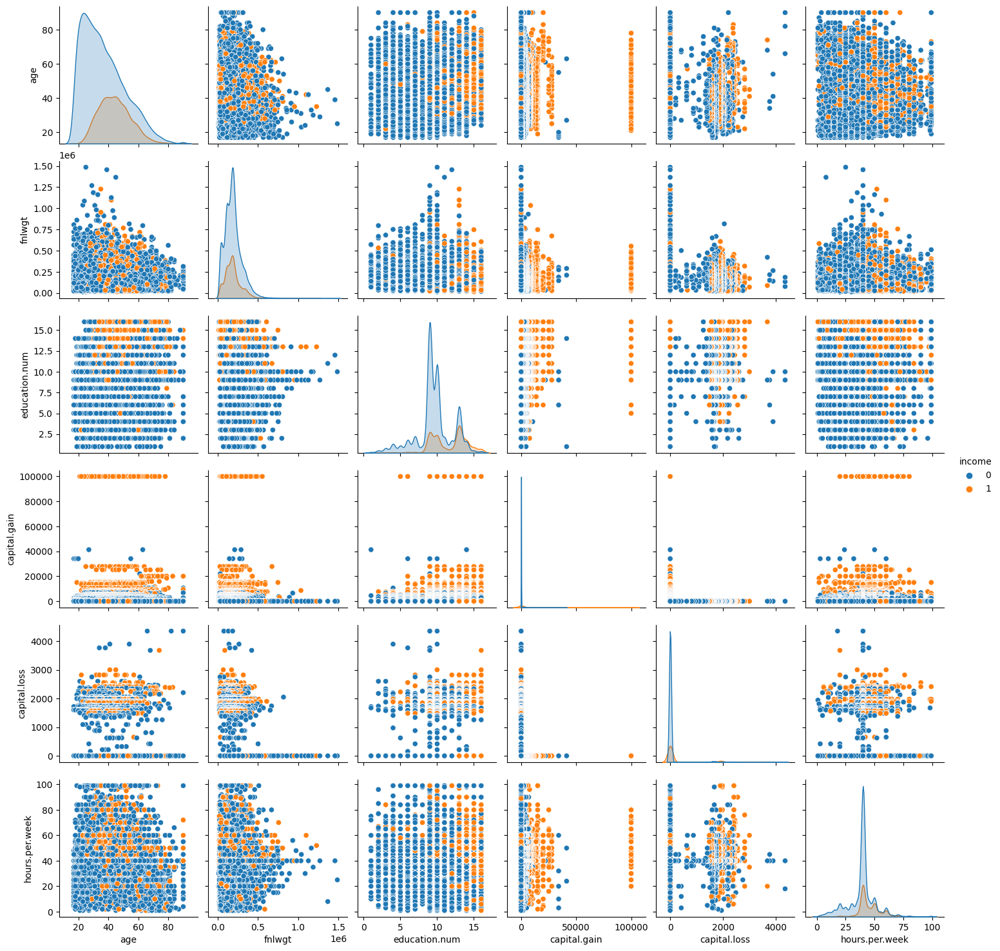

In [32]:
sns.pairplot(df, hue = "income");

## Age

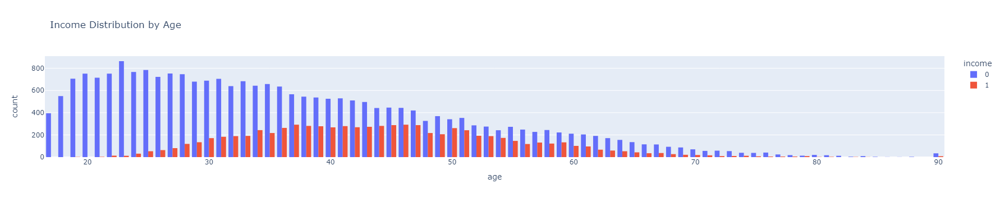

In [33]:
px.histogram(df, x='age', color="income", barmode='group', title='Income Distribution by Age')

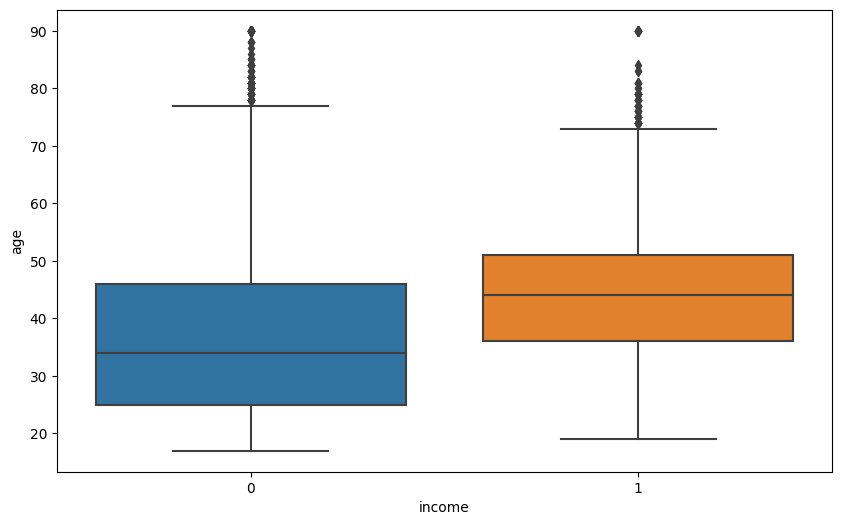

In [34]:
 sns.boxplot(data=df,y="age",x='income');

## Work Class 

In [35]:
value_cnt(df, 'workclass')

,workclass,counts,norm_counts
0,Private,24509,0.753266
1,Self-emp-not-inc,2540,0.078065
2,Local-gov,2093,0.064327
3,State-gov,1298,0.039893
4,Self-emp-inc,1116,0.034299
5,Federal-gov,960,0.029505
6,Without-pay,14,0.000430
7,Never-worked,7,0.000215


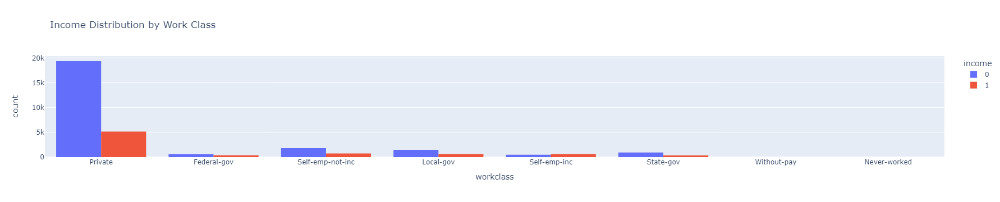

In [36]:
px.histogram(df, x='workclass', color="income", barmode='group', title='Income Distribution by Work Class')

## fnlwgt 

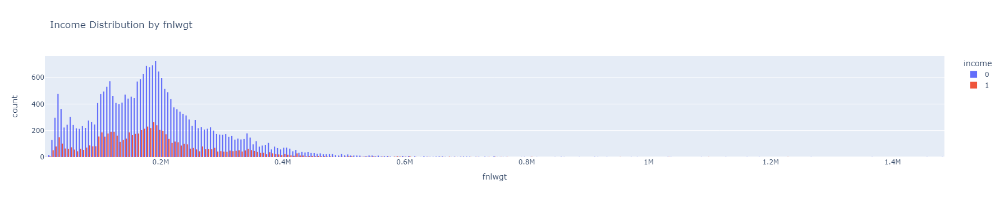

In [37]:
px.histogram(df, x='fnlwgt', color="income", barmode='group', title='Income Distribution by fnlwgt')

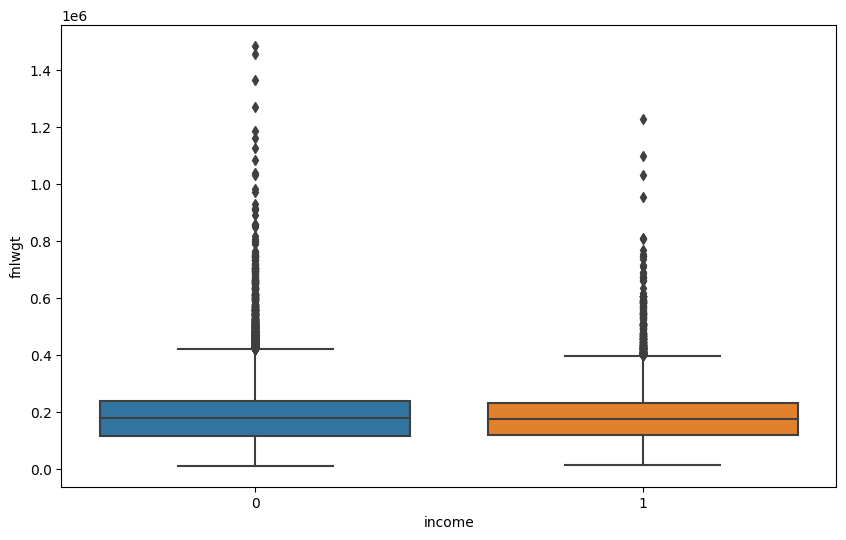

In [38]:
sns.boxplot(data=df,y="fnlwgt",x='income');

In [39]:
df.drop(['fnlwgt'], axis = 1, inplace = True)

## Education and Education Num

In [40]:
value_cnt(df, 'education')

,workclass,counts,norm_counts
0,HS-grad,10494,0.322525
1,Some-college,7282,0.223807
2,Bachelors,5353,0.164520
3,Masters,1722,0.052924
4,Assoc-voc,1382,0.042475
5,11th,1175,0.036113
6,Assoc-acdm,1067,0.032793
7,10th,933,0.028675
8,7th-8th,645,0.019824
9,Prof-school,576,0.017703


In [41]:
df['education'].replace(['11th', '9th', '7th-8th', '5th-6th', '10th', '1st-4th', '12th'], ' School', inplace = True)

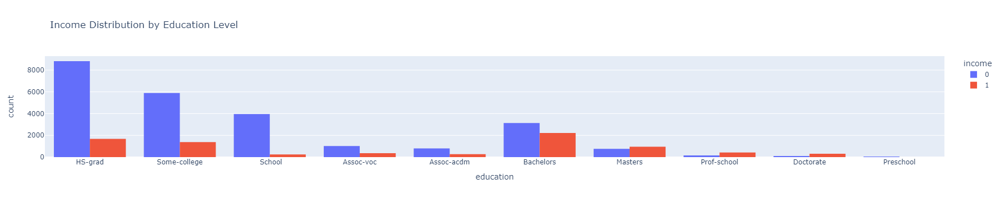

In [42]:
px.histogram(df, x='education', color=df.income, barmode='group', title='Income Distribution by Education Level')

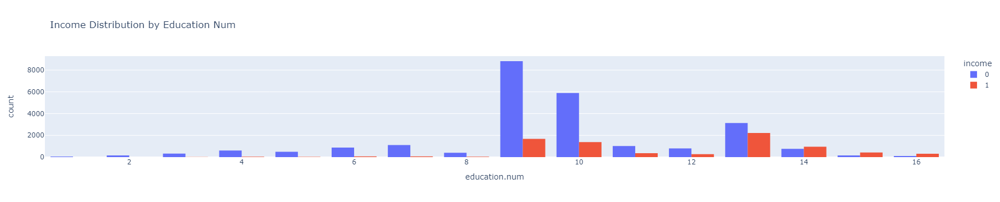

In [43]:
px.histogram(df, x='education.num', color="income", barmode='group', title='Income Distribution by Education Num')

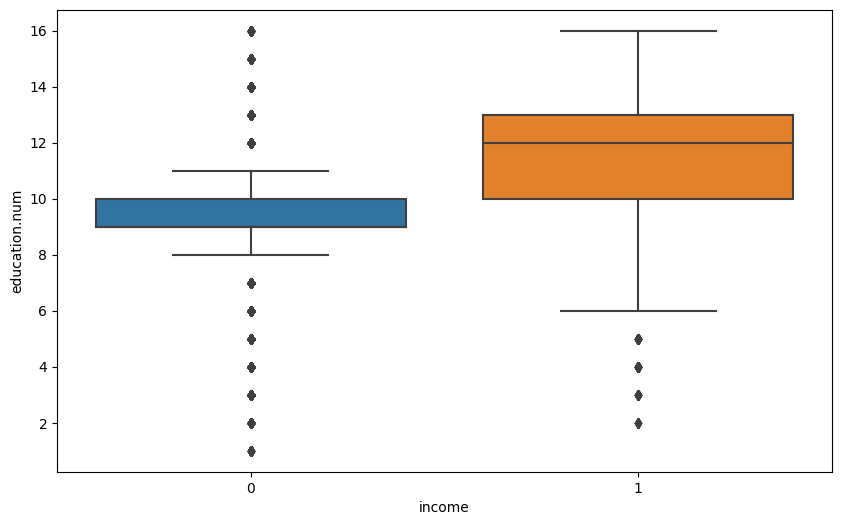

In [44]:
sns.boxplot(data=df,y="education.num",x='income');

## Marital Status

In [45]:
value_cnt(df, 'marital.status')

,workclass,counts,norm_counts
0,Married-civ-spouse,14970,0.460092
1,Never-married,10667,0.327842
2,Divorced,4441,0.136491
3,Separated,1025,0.031503
4,Widowed,993,0.030519
5,Married-spouse-absent,418,0.012847
6,Married-AF-spouse,23,0.000707


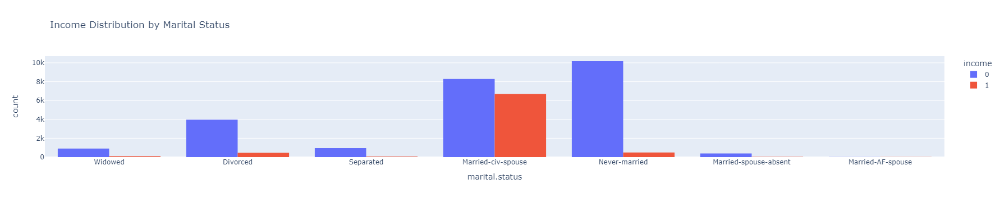

In [46]:
px.histogram(df, x='marital.status', color="income", barmode='group', title='Income Distribution by Marital Status')

## Occupation

In [47]:
value_cnt(df, 'occupation')

,workclass,counts,norm_counts
0,Prof-specialty,4394,0.135046
1,Craft-repair,4326,0.132956
2,Exec-managerial,4274,0.131358
3,Adm-clerical,3989,0.122599
4,Sales,3860,0.118634
5,Other-service,3516,0.108062
6,Machine-op-inspct,2126,0.065341
7,Transport-moving,1685,0.051787
8,Handlers-cleaners,1464,0.044995
9,Farming-fishing,1069,0.032855


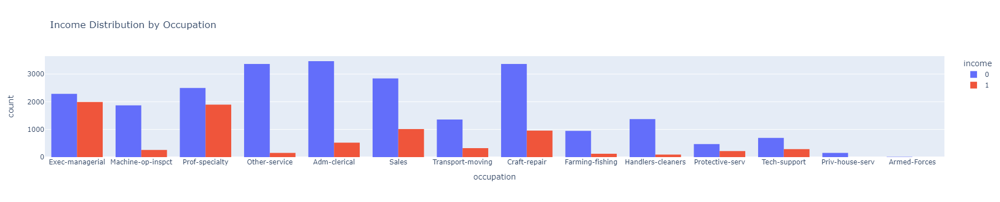

In [48]:
px.histogram(df, x='occupation', color="income", barmode='group', title='Income Distribution by Occupation')

## Relationship

In [49]:
value_cnt(df, 'relationship')

,workclass,counts,norm_counts
0,Husband,13187,0.405292
1,Not-in-family,8292,0.254848
2,Own-child,5064,0.155638
3,Unmarried,3445,0.105879
4,Wife,1568,0.048191
5,Other-relative,981,0.030150


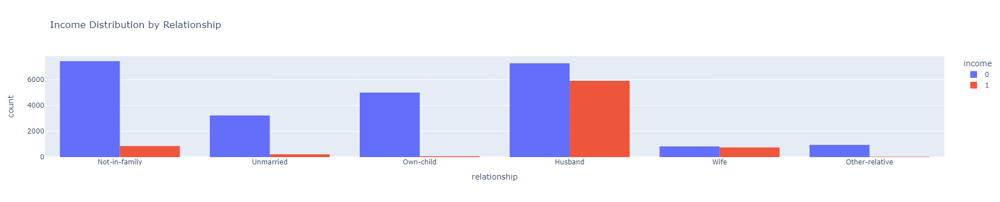

In [50]:
px.histogram(df, x='relationship', color="income", barmode='group', title='Income Distribution by Relationship')

## Race

In [51]:
value_cnt(df, 'race')

,workclass,counts,norm_counts
0,White,27795,0.854258
1,Black,3122,0.095952
2,Asian-Pac-Islander,1038,0.031902
3,Amer-Indian-Eskimo,311,0.009558
4,Other,271,0.008329


In [52]:
df['race'].replace(['Asian-Pac-Islander', 'Amer-Indian-Eskimo', 'Other'],' Others', inplace = True)

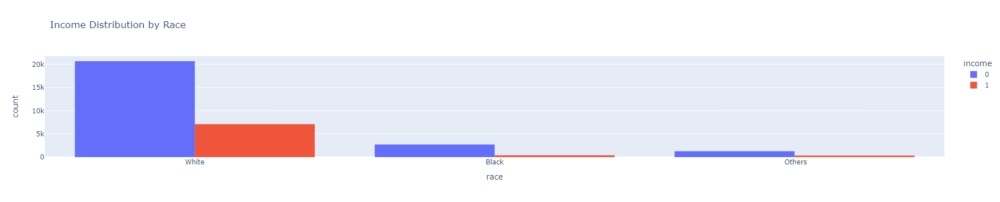

In [53]:
px.histogram(df, x='race', color="income", barmode='group', title='Income Distribution by Race')

## Sex

In [54]:
value_cnt(df, 'sex')

,workclass,counts,norm_counts
0,Male,21775,0.669238
1,Female,10762,0.330762


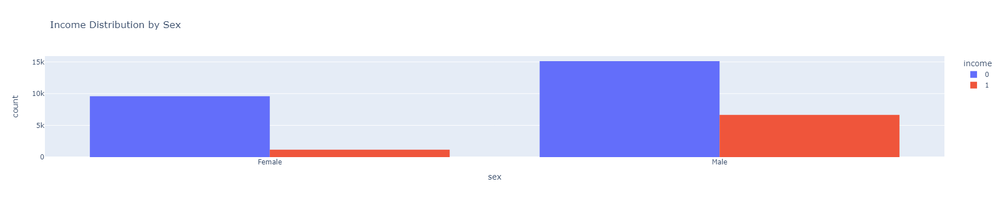

In [55]:
px.histogram(df, x='sex', color="income", barmode='group', title='Income Distribution by Sex')

## Capital Gain and Loss

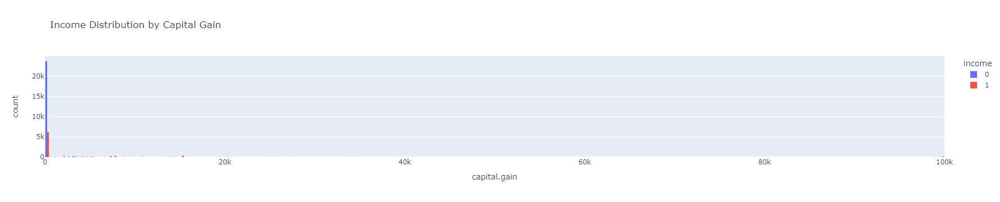

In [56]:
px.histogram(df, x='capital.gain', color="income", barmode='group', title='Income Distribution by Capital Gain')

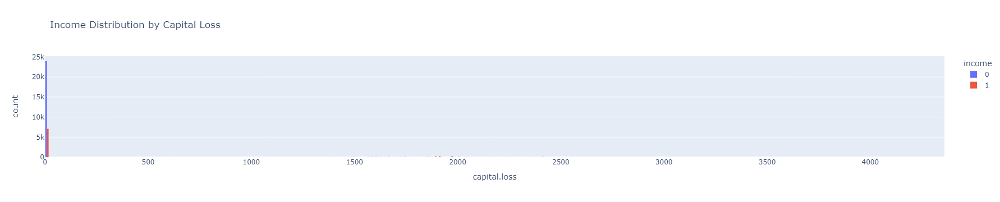

In [57]:
px.histogram(df, x='capital.loss', color="income", barmode='group', title='Income Distribution by Capital Loss')

In [58]:
df['capital_diff'] = df['capital.gain'] - df['capital.loss']
df['capital_diff'] = pd.cut(df['capital_diff'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
df['capital_diff'] = df['capital_diff'].astype('object')
df.drop(['capital.gain'], axis = 1, inplace = True)
df.drop(['capital.loss'], axis = 1, inplace = True)

'Capital Diff' sütununu iki kategoriye böler ('Minor' ve 'Major'). 

'Capital Diff' sütunundaki değerler, belirtilen sınırlar arasında kesilerek (cut) kategorilere ayrılır. 

Bu sınırlar, bins parametresi ile belirtilir. 

-5000 ve 5000 sınırları arasındaki değerler 'Minor' kategorisine atanırken, 5000 ve 100000 sınırları arasındaki değerler 'Major' kategorisine atanır.

In [59]:
value_cnt(df, 'capital_diff')

,workclass,counts,norm_counts
0,Low,30889,0.94935
1,High,1648,0.05065


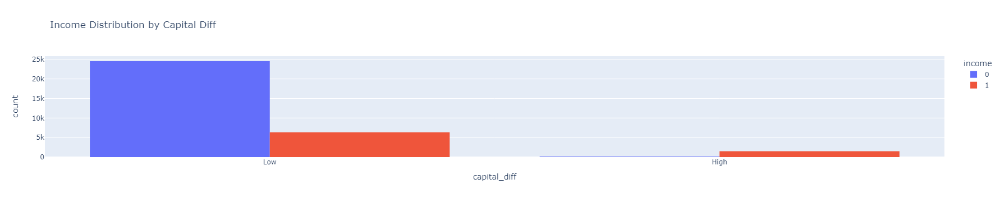

In [60]:
px.histogram(df, x='capital_diff', color="income", barmode='group', title='Income Distribution by Capital Diff')

## Hours per Week

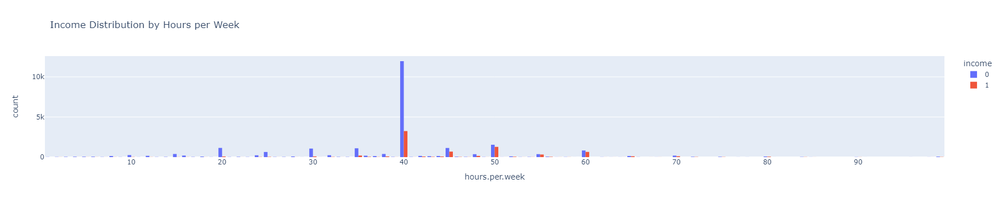

In [61]:
px.histogram(df, x='hours.per.week', color="income", barmode='group', title='Income Distribution by Hours per Week')

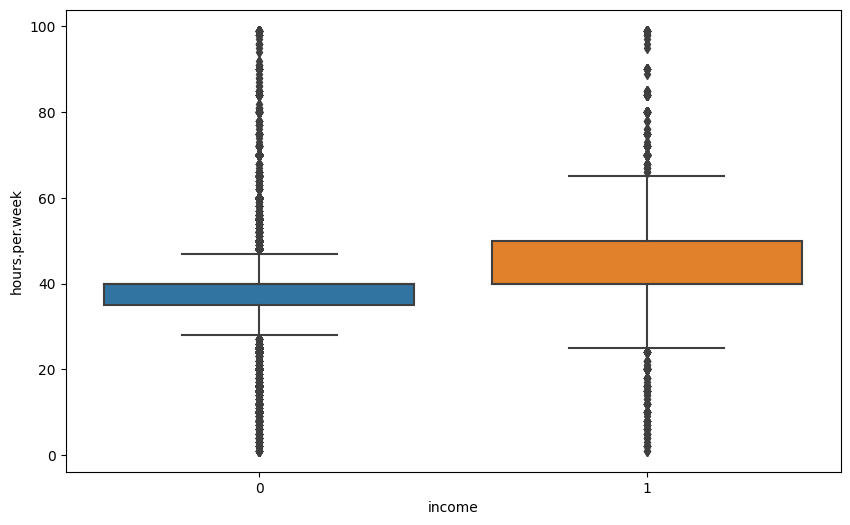

In [62]:
sns.boxplot(data=df,y="hours.per.week",x='income');

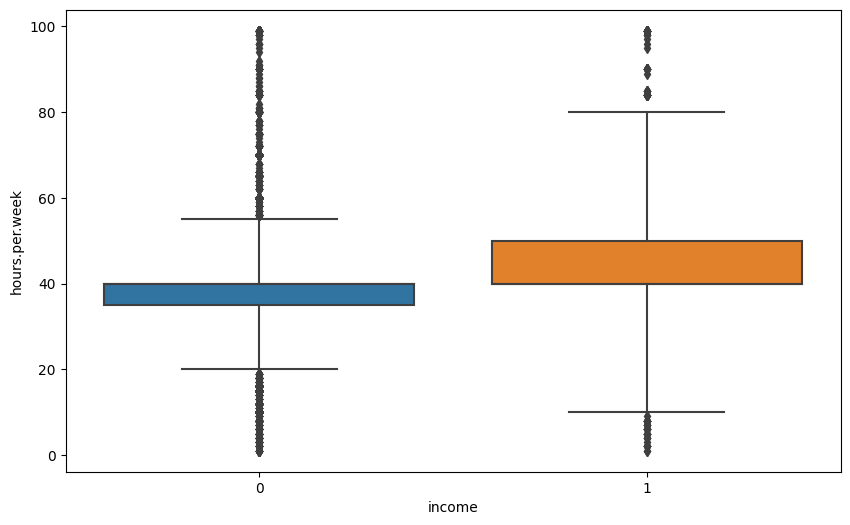

In [63]:
sns.boxplot(data=df,y="hours.per.week",x='income', whis=3);

In [64]:
len(df[df["hours.per.week"]>72])  

427

In [65]:
len(df[df["hours.per.week"]<20])  

1700

In [66]:
len(df[(df["hours.per.week"] > 72) | (df["hours.per.week"] < 20)])

2127

In [67]:
df = df[~((df["hours.per.week"] > 72) | (df["hours.per.week"] < 20))]

In [68]:
df.shape

(30410, 13)

## Native Country

In [69]:
value_cnt(df, 'native.country')

,workclass,counts,norm_counts
0,United-States,27762,0.912923
1,Mexico,613,0.020158
2,Philippines,186,0.006116
3,Germany,127,0.004176
4,Canada,113,0.003716
5,Puerto-Rico,109,0.003584
6,El-Salvador,100,0.003288
7,India,95,0.003124
8,Cuba,90,0.002960
9,England,84,0.002762


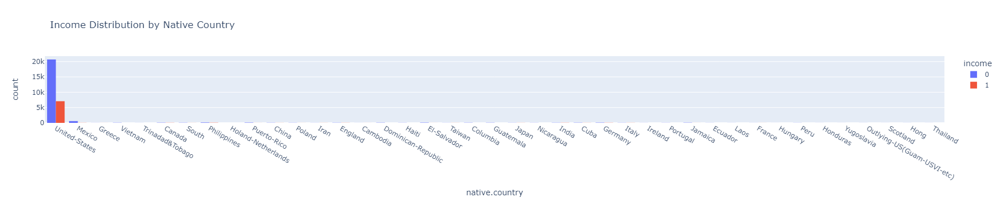

In [70]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [71]:
df['native.country'].loc[df['native.country'] != 'United-States'] = 'Others'

In [72]:
value_cnt(df, 'native.country')

,workclass,counts,norm_counts
0,United-States,27762,0.912923
1,Others,2648,0.087077


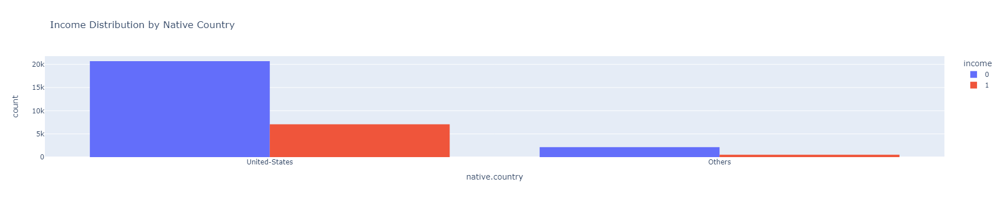

In [73]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [74]:
df1 = df.copy()

# Data Pre-Processing

## Train | Test Split

In [75]:
X= df.drop(columns="income")
y= df.income

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y, random_state=101)

In [77]:
categorical = ['workclass', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country','education', 'capital_diff']
label_encoder = LabelEncoder()

for feature in categorical:
        X_train[feature] = label_encoder.fit_transform(X_train[feature])
        X_test[feature] = label_encoder.transform(X_test[feature])

# Implement Logistic Regression

In [78]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

log_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression())])

In [79]:
y_pred = log_pipe.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

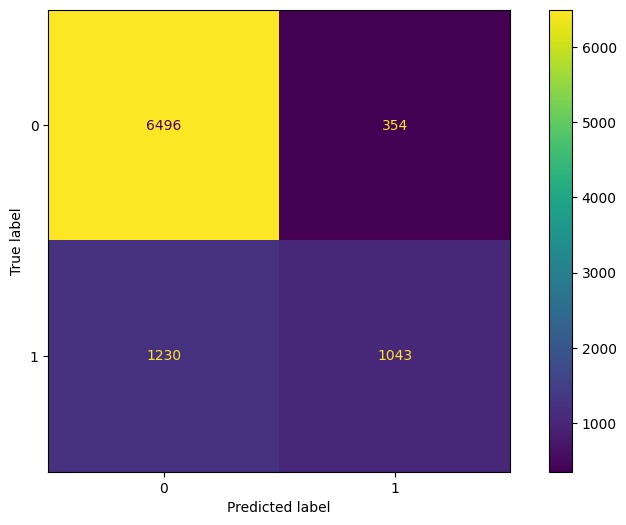

In [80]:
plot_confusion_matrix(log_pipe, X_test, y_test)

In [81]:
def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [82]:
eval_metric(log_pipe, X_train, y_train, X_test, y_test) 

Test_Set
[[6496  354]
 [1230 1043]]
              precision    recall  f1-score   support

           0       0.84      0.95      0.89      6850
           1       0.75      0.46      0.57      2273

    accuracy                           0.83      9123
   macro avg       0.79      0.70      0.73      9123
weighted avg       0.82      0.83      0.81      9123


Train_Set
[[15074   909]
 [ 2930  2374]]
              precision    recall  f1-score   support

           0       0.84      0.94      0.89     15983
           1       0.72      0.45      0.55      5304

    accuracy                           0.82     21287
   macro avg       0.78      0.70      0.72     21287
weighted avg       0.81      0.82      0.80     21287



### GridSearchCV

In [83]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

penalty = ["l1", "l2"]
C = [0.01, 0.1, 1] 
class_weight= ["balanced", None] 


solver = ["lbfgs", "liblinear"] #"sag", "saga"

param_grid = {"logistic__penalty" : penalty,
              "logistic__C" : C,
              "logistic__class_weight":class_weight,
              "logistic__solver":solver}



cv = StratifiedKFold(n_splits = 10) 

grid_model = GridSearchCV(estimator=log_pipe,
                          param_grid=param_grid,
                          cv=cv,
                          scoring = "recall",   
                          n_jobs = -1,
                          return_train_score=True)

In [84]:
log_pipe.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('logistic', LogisticRegression())],
 'verbose': False,
 'scaler': StandardScaler(),
 'logistic': LogisticRegression(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'logistic__C': 1.0,
 'logistic__class_weight': None,
 'logistic__dual': False,
 'logistic__fit_intercept': True,
 'logistic__intercept_scaling': 1,
 'logistic__l1_ratio': None,
 'logistic__max_iter': 100,
 'logistic__multi_class': 'auto',
 'logistic__n_jobs': None,
 'logistic__penalty': 'l2',
 'logistic__random_state': None,
 'logistic__solver': 'lbfgs',
 'logistic__tol': 0.0001,
 'logistic__verbose': 0,
 'logistic__warm_start': False}

In [85]:
grid_model.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'logistic__C': [0.01, 0.1, 1],
                         'logistic__class_weight': ['balanced', None],
                         'logistic__penalty': ['l1', 'l2'],
                         'logistic__solver': ['lbfgs', 'liblinear']},
             return_train_score=True, scoring='recall')

In [86]:
grid_model.best_params_

{'logistic__C': 0.01,
 'logistic__class_weight': 'balanced',
 'logistic__penalty': 'l1',
 'logistic__solver': 'liblinear'}

In [87]:
grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic',
                 LogisticRegression(C=0.01, class_weight='balanced',
                                    penalty='l1', solver='liblinear'))])

In [88]:
grid_model.best_score_

0.7714934441957146

In [89]:
grid_model.best_index_

1

In [90]:
pd.DataFrame(grid_model.cv_results_).loc[1, ["mean_test_score", "mean_train_score"]]


# ilgili df'in best indexinden "mean_test_score" ile "mean_train_score" ları çekilip karşılaştırılırak overfitig,
# underfiting değerlendirilmesi yapılır. 

# GridsearchCV aynı zamanda Cross validation işlemi de yaptığından extradan cross validation yapmamıza gerek yok.

# Burda aldığımız scorelar gridsearchcv içerisine verdiğimiz scoring metricinin scorelarıdır.

mean_test_score     0.771493
mean_train_score    0.770551
Name: 1, dtype: object

In [91]:
eval_metric(grid_model, X_train, y_train, X_test, y_test)  

Test_Set
[[5250 1600]
 [ 518 1755]]
              precision    recall  f1-score   support

           0       0.91      0.77      0.83      6850
           1       0.52      0.77      0.62      2273

    accuracy                           0.77      9123
   macro avg       0.72      0.77      0.73      9123
weighted avg       0.81      0.77      0.78      9123


Train_Set
[[12162  3821]
 [ 1213  4091]]
              precision    recall  f1-score   support

           0       0.91      0.76      0.83     15983
           1       0.52      0.77      0.62      5304

    accuracy                           0.76     21287
   macro avg       0.71      0.77      0.72     21287
weighted avg       0.81      0.76      0.78     21287



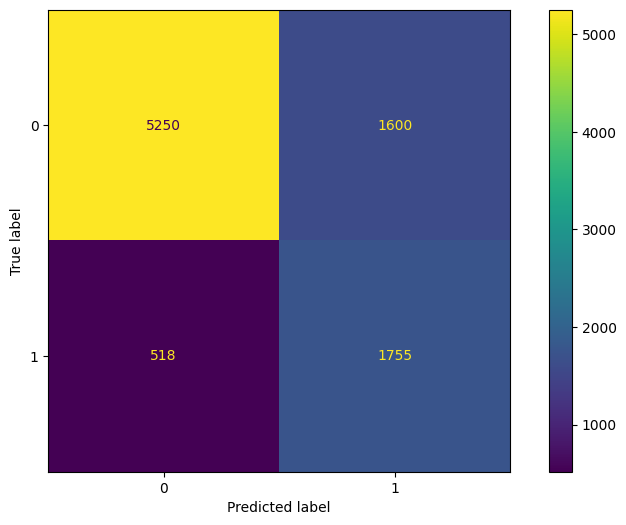

In [92]:
plot_confusion_matrix(grid_model, X_test, y_test)

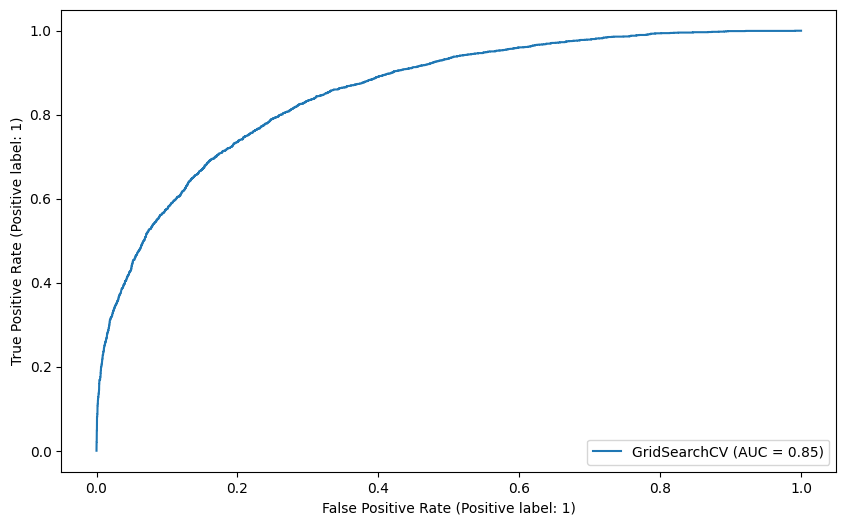

In [93]:
plot_roc_curve(grid_model, X_test, y_test); 

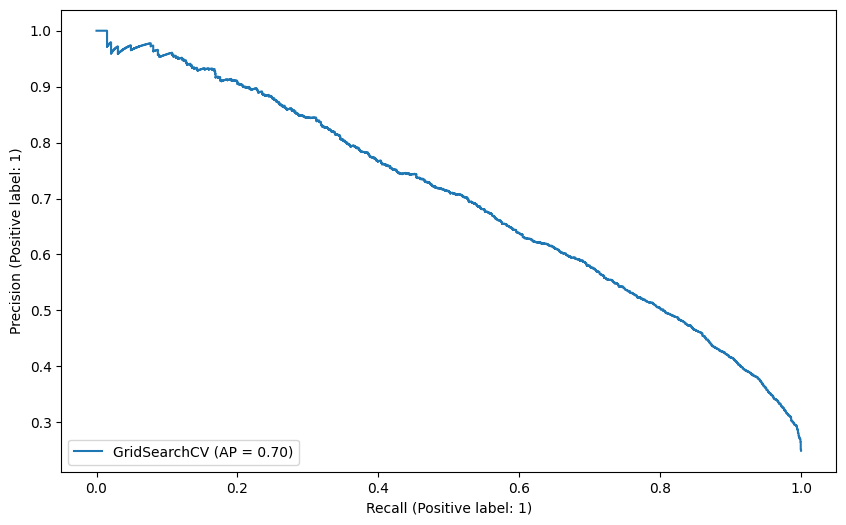

In [94]:
plot_precision_recall_curve(grid_model, X_test, y_test);

# Implement K Nearest Neigbors (KNN)

In [95]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]

knn_pipe = Pipeline(steps=operations)

knn_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [96]:
y_pred = knn_pipe.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [97]:
y_pred_proba = knn_pipe.predict_proba(X_test)

In [98]:
pd.DataFrame(y_pred_proba)

,0,1
0,0.8,0.2
1,0.6,0.4
2,1.0,0.0
3,0.0,1.0
4,0.2,0.8
...,...,...
9118,1.0,0.0
9119,0.8,0.2
9120,1.0,0.0
9121,1.0,0.0


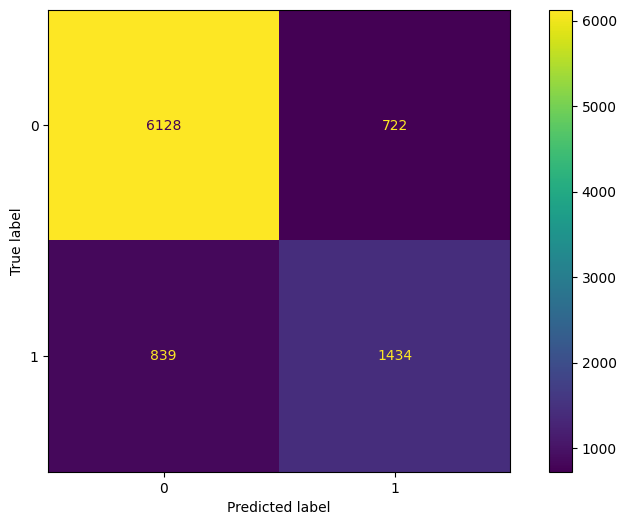

In [99]:
plot_confusion_matrix(knn_pipe, X_test, y_test);

In [100]:
eval_metric(knn_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[6128  722]
 [ 839 1434]]
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      6850
           1       0.67      0.63      0.65      2273

    accuracy                           0.83      9123
   macro avg       0.77      0.76      0.77      9123
weighted avg       0.83      0.83      0.83      9123


Train_Set
[[14907  1076]
 [ 1571  3733]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.92     15983
           1       0.78      0.70      0.74      5304

    accuracy                           0.88     21287
   macro avg       0.84      0.82      0.83     21287
weighted avg       0.87      0.88      0.87     21287



## Elbow Method for Choosing Reasonable K Values

In [101]:
test_error_rates = []


for k in range(1,10):
    
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]

    knn_pipe_model = Pipeline(steps=operations)
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring = ['recall'], cv = 5)
    
    recall_mean = scores["test_recall"].mean() 
    
    test_error = 1 - recall_mean
    
    test_error_rates.append(test_error)

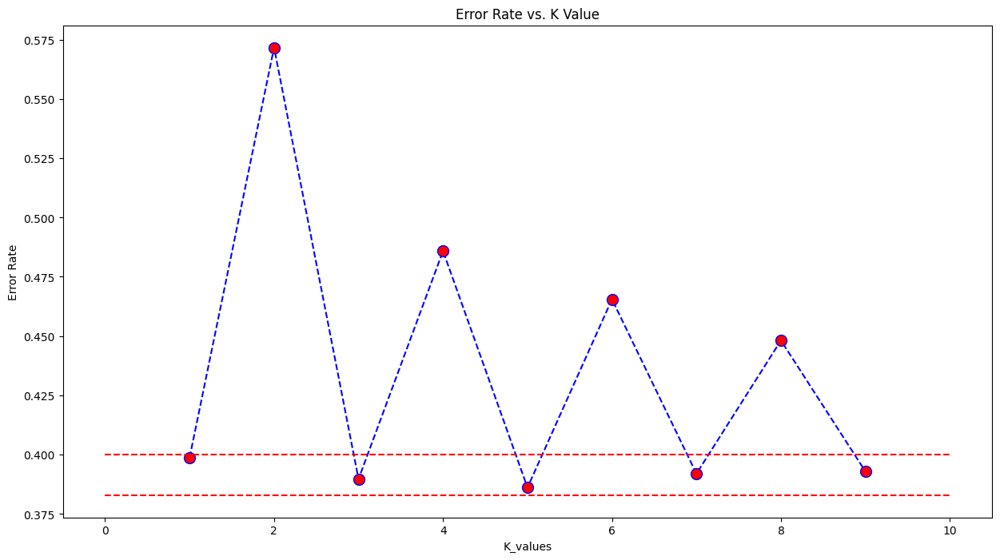

In [102]:
plt.figure(figsize=(15,8))
plt.plot(range(1,10), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.4, xmin = 0, xmax = 10, colors= 'r', linestyles="--")
plt.hlines(y=0.383, xmin = 0, xmax = 10, colors= 'r', linestyles="--")

## Overfiting and underfiting control for k values

In [103]:
test_error_rates = []
train_error_rates = []

for k in range(1,10):
    
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]
    knn_pipe_model = Pipeline(steps=operations)
    
    knn_pipe_model.fit(X_train,y_train) 
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring = ['recall'], cv = 5, return_train_score=True)
    
    recall_test_mean = scores["test_recall"].mean() 
    recall_train_mean = scores["train_recall"].mean() 

    
    test_error = 1 - recall_test_mean
    train_error = 1 - recall_train_mean
    test_error_rates.append(test_error)
    train_error_rates.append(train_error)

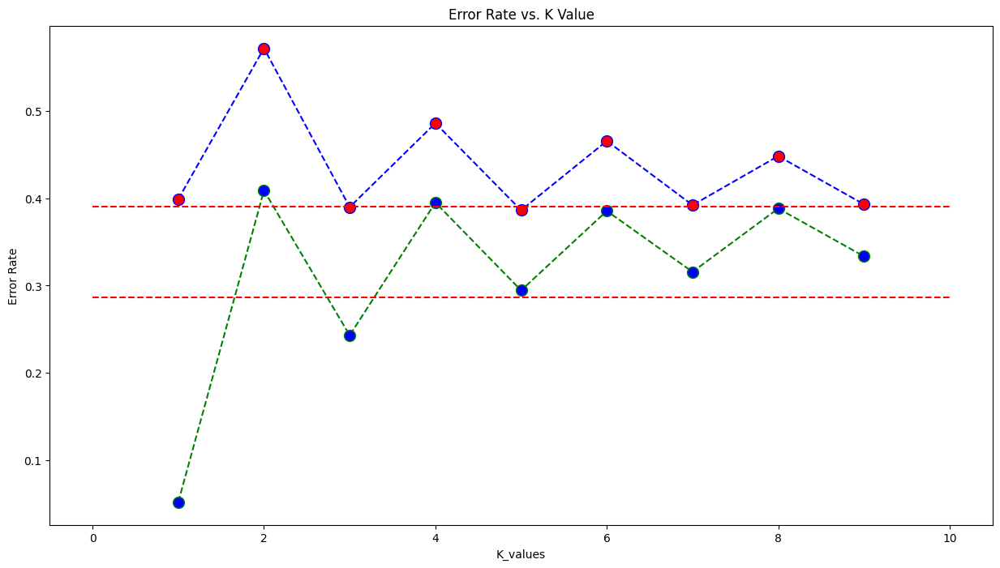

In [104]:
plt.figure(figsize=(15,8))
plt.plot(range(1,10), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.plot(range(1,10), train_error_rates, color='green', linestyle='--', marker='o',
         markerfacecolor='blue', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.39, xmin = 0, xmax = 10, colors= 'r', linestyles="--")
plt.hlines(y=0.286, xmin = 0, xmax = 10, colors= 'r', linestyles="--")

## Scores by Various K Values

In [105]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=3))]
knn3 = Pipeline(steps=operations)

knn3.fit(X_train, y_train)
print('WITH K=3\n')
eval_metric(knn3, X_train, y_train, X_test, y_test)

WITH K=3

Test_Set
[[6068  782]
 [ 855 1418]]
              precision    recall  f1-score   support

           0       0.88      0.89      0.88      6850
           1       0.64      0.62      0.63      2273

    accuracy                           0.82      9123
   macro avg       0.76      0.75      0.76      9123
weighted avg       0.82      0.82      0.82      9123


Train_Set
[[15008   975]
 [ 1278  4026]]
              precision    recall  f1-score   support

           0       0.92      0.94      0.93     15983
           1       0.81      0.76      0.78      5304

    accuracy                           0.89     21287
   macro avg       0.86      0.85      0.86     21287
weighted avg       0.89      0.89      0.89     21287



In [106]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=5))]
knn5 = Pipeline(steps=operations)

knn5.fit(X_train, y_train)
print('WITH K=5\n')
eval_metric(knn5, X_train, y_train, X_test, y_test)

WITH K=5

Test_Set
[[6128  722]
 [ 839 1434]]
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      6850
           1       0.67      0.63      0.65      2273

    accuracy                           0.83      9123
   macro avg       0.77      0.76      0.77      9123
weighted avg       0.83      0.83      0.83      9123


Train_Set
[[14907  1076]
 [ 1571  3733]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.92     15983
           1       0.78      0.70      0.74      5304

    accuracy                           0.88     21287
   macro avg       0.84      0.82      0.83     21287
weighted avg       0.87      0.88      0.87     21287



In [107]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=7))]
knn7 = Pipeline(steps=operations)

knn7.fit(X_train, y_train)
print('WITH K=7\n')
eval_metric(knn7, X_train, y_train, X_test, y_test)

WITH K=7

Test_Set
[[6164  686]
 [ 851 1422]]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      6850
           1       0.67      0.63      0.65      2273

    accuracy                           0.83      9123
   macro avg       0.78      0.76      0.77      9123
weighted avg       0.83      0.83      0.83      9123


Train_Set
[[14892  1091]
 [ 1685  3619]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.91     15983
           1       0.77      0.68      0.72      5304

    accuracy                           0.87     21287
   macro avg       0.83      0.81      0.82     21287
weighted avg       0.87      0.87      0.87     21287



## Cross Validate For Optimal K Value

In [108]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=7))]
model = Pipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1
1,0.068815,0.300236,0.844528,0.868880,0.696252,0.764871,0.666038,0.684122,0.680810,0.722247
2,0.060849,0.302171,0.830907,0.869036,0.682403,0.764912,0.600000,0.684960,0.638554,0.722732
3,0.058881,0.304176,0.825270,0.868410,0.661224,0.767006,0.611321,0.677838,0.635294,0.719671
4,0.059348,0.303190,0.819634,0.870498,0.657388,0.765893,0.578154,0.691599,0.615230,0.726852
5,0.060422,0.304159,0.837482,0.869245,0.705100,0.770129,0.598870,0.677352,0.647658,0.720767
6,0.059857,0.302310,0.833255,0.869924,0.689655,0.767033,0.602637,0.686361,0.643216,0.724458
7,0.059840,0.302247,0.842179,0.868253,0.703549,0.765525,0.634652,0.679237,0.667327,0.719805
8,0.060809,0.314224,0.839286,0.868678,0.700855,0.766148,0.618868,0.680771,0.657315,0.720941
9,0.063939,0.338617,0.826598,0.868052,0.665298,0.764983,0.611321,0.679095,0.637168,0.719485
10,0.067818,0.384970,0.836466,0.868574,0.692797,0.764913,0.616981,0.682237,0.652695,0.721213


In [109]:
df_scores.mean()[2:]

test_accuracy      0.833560
train_accuracy     0.868955
test_precision     0.685452
train_precision    0.766142
test_recall        0.613884
train_recall       0.682357
test_f1            0.647527
train_f1           0.721817
dtype: float64

## Gridsearch Method for Choosing Reasonable K Values

In [110]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]
knn_model = Pipeline(steps=operations)

In [111]:
knn_model.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('knn', KNeighborsClassifier())],
 'verbose': False,
 'scaler': StandardScaler(),
 'knn': KNeighborsClassifier(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'knn__algorithm': 'auto',
 'knn__leaf_size': 30,
 'knn__metric': 'minkowski',
 'knn__metric_params': None,
 'knn__n_jobs': None,
 'knn__n_neighbors': 5,
 'knn__p': 2,
 'knn__weights': 'uniform'}

In [112]:
k_values= range(1,10)

In [113]:
param_grid = {"knn__n_neighbors":k_values, "knn__p": [1,2], "knn__weights": ['uniform', "distance"]}

In [114]:
knn_grid_model = GridSearchCV(knn_model, param_grid, cv=10, scoring = "recall", return_train_score=True, n_jobs=-1)

In [115]:
knn_grid_model.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'knn__n_neighbors': range(1, 10), 'knn__p': [1, 2],
                         'knn__weights': ['uniform', 'distance']},
             return_train_score=True, scoring='recall')

In [116]:
knn_grid_model.best_params_

{'knn__n_neighbors': 9, 'knn__p': 1, 'knn__weights': 'uniform'}

In [117]:
knn_grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=9, p=1))])

In [118]:
knn_grid_model.best_index_

32

In [119]:
pd.DataFrame(knn_grid_model.cv_results_).loc[32, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.621798
mean_train_score    0.676031
Name: 32, dtype: object

In [120]:
knn_grid_model.best_score_

0.6217976050882991

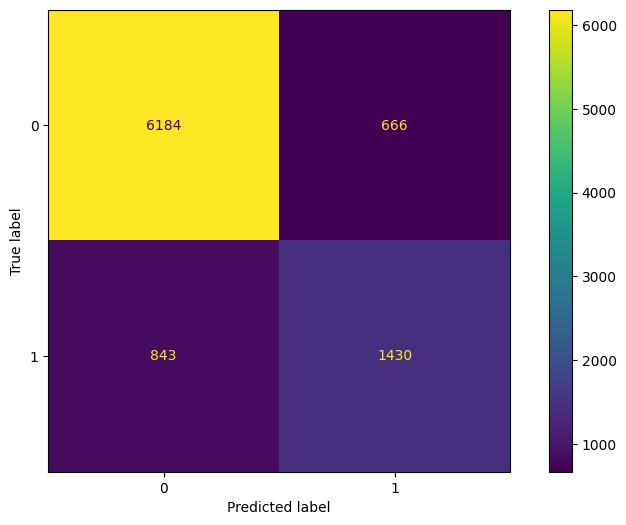

In [121]:
plot_confusion_matrix(knn_grid_model, X_test, y_test)

In [122]:
print('WITH K=9\n')
eval_metric(knn_grid_model, X_train, y_train, X_test, y_test)

WITH K=9

Test_Set
[[6184  666]
 [ 843 1430]]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      6850
           1       0.68      0.63      0.65      2273

    accuracy                           0.83      9123
   macro avg       0.78      0.77      0.77      9123
weighted avg       0.83      0.83      0.83      9123


Train_Set
[[14822  1161]
 [ 1710  3594]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.91     15983
           1       0.76      0.68      0.71      5304

    accuracy                           0.87     21287
   macro avg       0.83      0.80      0.81     21287
weighted avg       0.86      0.87      0.86     21287



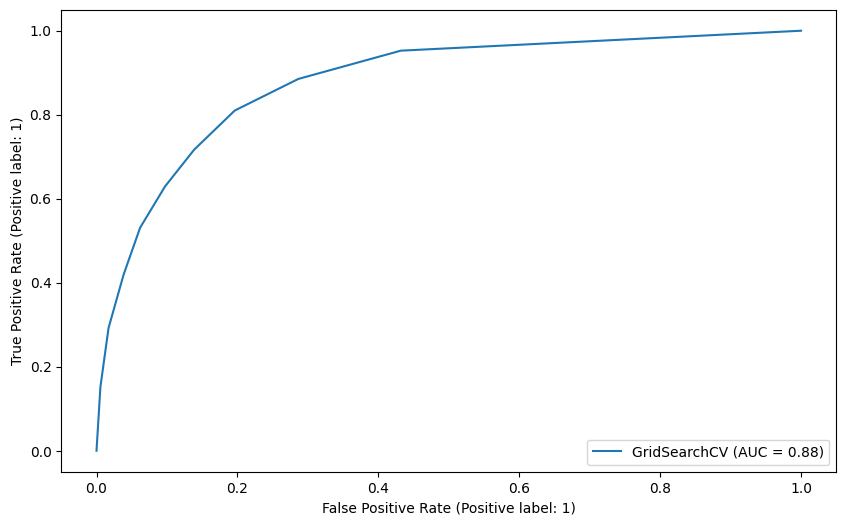

In [123]:
plot_roc_curve(knn_grid_model, X_test, y_test)

In [124]:
y_pred_proba = knn_grid_model.predict_proba(X_test)
roc_auc_score(y_test, y_pred_proba[:,1])

0.8787727078589985

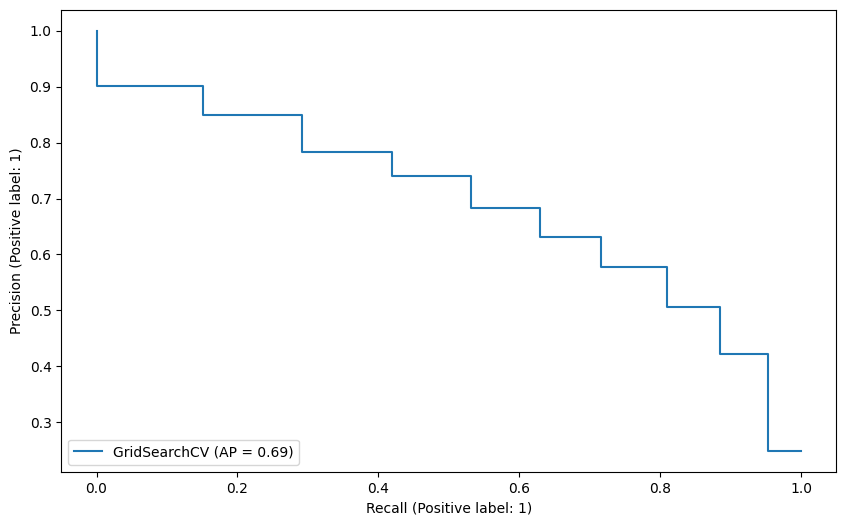

In [125]:
plot_precision_recall_curve(knn_grid_model, X_test, y_test);

# Implement Decision Tree

In [126]:
dt_model = DecisionTreeClassifier(random_state=101)

In [127]:
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=101)

In [128]:
y_pred = dt_model.predict(X_test)
y_train_pred = dt_model.predict(X_train)

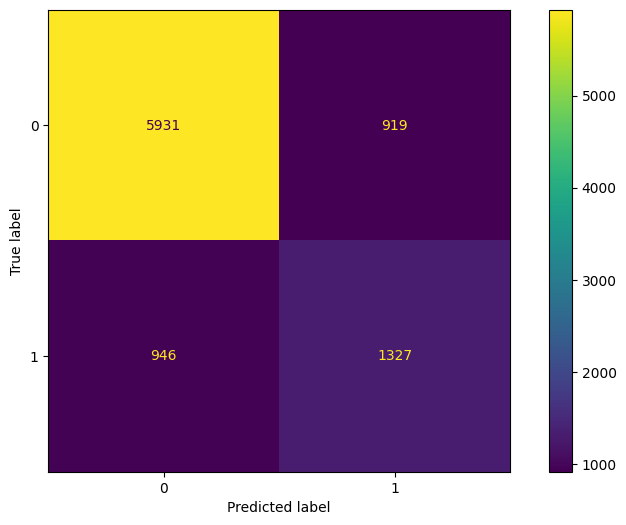

In [129]:
plot_confusion_matrix(dt_model,X_test,y_test)

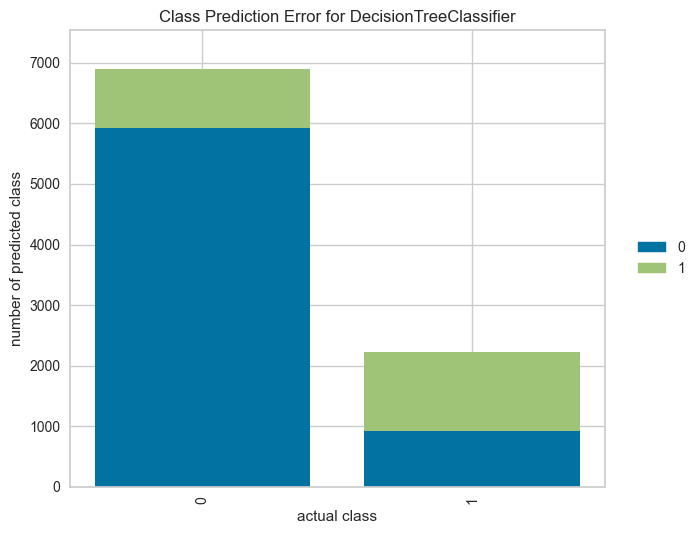

In [166]:
from yellowbrick.classifier import ClassPredictionError

visualizer = ClassPredictionError(dt_model)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.poof();

In [131]:
eval_metric(dt_model, X_train, y_train, X_test, y_test)

Test_Set
[[5931  919]
 [ 946 1327]]
              precision    recall  f1-score   support

           0       0.86      0.87      0.86      6850
           1       0.59      0.58      0.59      2273

    accuracy                           0.80      9123
   macro avg       0.73      0.72      0.73      9123
weighted avg       0.79      0.80      0.80      9123


Train_Set
[[15891    92]
 [  448  4856]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     15983
           1       0.98      0.92      0.95      5304

    accuracy                           0.97     21287
   macro avg       0.98      0.95      0.97     21287
weighted avg       0.97      0.97      0.97     21287



In [132]:
scores = cross_validate(dt_model, X_train, y_train, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], 
                        cv = 10, return_train_score=True)

df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision_micro,train_precision_micro,test_recall_micro,train_recall_micro,test_f1_micro,train_f1_micro
1,0.042885,0.004987,0.798967,0.975676,0.798967,0.975676,0.798967,0.975676,0.798967,0.975676
2,0.040890,0.004987,0.802255,0.975519,0.802255,0.975519,0.802255,0.975519,0.802255,0.975519
3,0.040897,0.003990,0.801315,0.975989,0.801315,0.975989,0.801315,0.975989,0.801315,0.975989
4,0.039893,0.003989,0.774542,0.976198,0.774542,0.976198,0.774542,0.976198,0.774542,0.976198
5,0.040891,0.003989,0.795209,0.976616,0.795209,0.976616,0.795209,0.976616,0.795209,0.976616
6,0.039866,0.003990,0.783936,0.976250,0.783936,0.976250,0.783936,0.976250,0.783936,0.976250
7,0.040890,0.004991,0.805073,0.975728,0.805073,0.975728,0.805073,0.975728,0.805073,0.975728
8,0.040890,0.004987,0.805921,0.975468,0.805921,0.975468,0.805921,0.975468,0.805921,0.975468
9,0.044908,0.004987,0.794643,0.976147,0.794643,0.976147,0.794643,0.976147,0.794643,0.976147
10,0.040918,0.004959,0.793233,0.975938,0.793233,0.975938,0.793233,0.975938,0.793233,0.975938


In [133]:
df_scores.mean()[2:]

test_accuracy            0.795509
train_accuracy           0.975953
test_precision_micro     0.795509
train_precision_micro    0.975953
test_recall_micro        0.795509
train_recall_micro       0.975953
test_f1_micro            0.795509
train_f1_micro           0.975953
dtype: float64

In [134]:
def report_model(model):
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    print('\n')
    print(eval_metric(model, X_train, y_train, X_test, y_test))
    print('\n')
    plt.figure(figsize=(12,8),dpi=100)
    plot_tree(model,filled=True, feature_names=X.columns, fontsize=10);

In [135]:
pruned_tree = DecisionTreeClassifier(max_depth=3, random_state=101)
pruned_tree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=3, random_state=101)



Test_Set
[[6505  345]
 [1142 1131]]
              precision    recall  f1-score   support

           0       0.85      0.95      0.90      6850
           1       0.77      0.50      0.60      2273

    accuracy                           0.84      9123
   macro avg       0.81      0.72      0.75      9123
weighted avg       0.83      0.84      0.82      9123


Train_Set
[[15190   793]
 [ 2793  2511]]
              precision    recall  f1-score   support

           0       0.84      0.95      0.89     15983
           1       0.76      0.47      0.58      5304

    accuracy                           0.83     21287
   macro avg       0.80      0.71      0.74     21287
weighted avg       0.82      0.83      0.82     21287

None




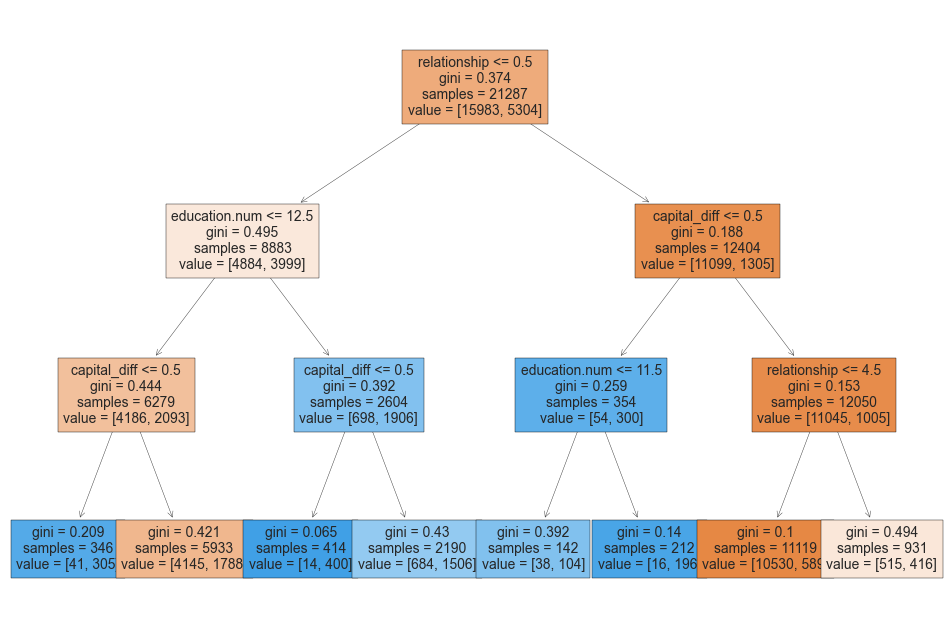

In [136]:
from sklearn.tree import plot_tree

report_model(pruned_tree)
plt.show()

## GridSearchCV

In [137]:
dt_model = DecisionTreeClassifier()

In [138]:
dt_model.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [139]:
param_grid = {"splitter":["best", "random"],
              "max_features":[None, "auto"],
              "max_depth": [None, 2, 3],
              "min_samples_leaf": [3,4,5],
              "min_samples_split": [3,5,6],
              'class_weight': [None, "balanced"]}

In [140]:
grid_model = GridSearchCV(estimator=dt_model,
                          param_grid=param_grid,
                          scoring='recall',
                          cv=10,
                          n_jobs = -1,
                          return_train_score=True)

In [141]:
grid_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'class_weight': [None, 'balanced'],
                         'max_depth': [None, 2, 3],
                         'max_features': [None, 'auto'],
                         'min_samples_leaf': [3, 4, 5],
                         'min_samples_split': [3, 5, 6],
                         'splitter': ['best', 'random']},
             return_train_score=True, scoring='recall')

In [142]:
grid_model.best_index_

159

In [143]:
pd.DataFrame(grid_model.cv_results_).loc[153, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.836904
mean_train_score    0.831994
Name: 153, dtype: object

In [144]:
grid_model.best_score_

0.8838396759407313

In [145]:
grid_model.best_params_

{'class_weight': 'balanced',
 'max_depth': 2,
 'max_features': None,
 'min_samples_leaf': 5,
 'min_samples_split': 5,
 'splitter': 'random'}

In [146]:
grid_model.best_estimator_

DecisionTreeClassifier(class_weight='balanced', max_depth=2, min_samples_leaf=5,
                       min_samples_split=5, splitter='random')

In [147]:
model_dt = DecisionTreeClassifier(class_weight='balanced', max_depth=2, min_samples_leaf=4,
                       min_samples_split=5, splitter='random')

In [148]:
model_dt.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=2, min_samples_leaf=4,
                       min_samples_split=5, splitter='random')

In [149]:
y_pred = model_dt.predict(X_test)
y_train_pred = model_dt.predict(X_train)

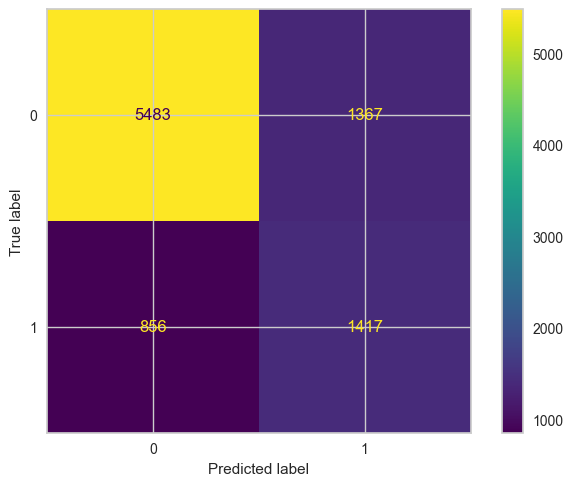

In [150]:
plot_confusion_matrix(model_dt,X_test,y_test)



Test_Set
[[5483 1367]
 [ 856 1417]]
              precision    recall  f1-score   support

           0       0.86      0.80      0.83      6850
           1       0.51      0.62      0.56      2273

    accuracy                           0.76      9123
   macro avg       0.69      0.71      0.70      9123
weighted avg       0.78      0.76      0.76      9123


Train_Set
[[12769  3214]
 [ 2156  3148]]
              precision    recall  f1-score   support

           0       0.86      0.80      0.83     15983
           1       0.49      0.59      0.54      5304

    accuracy                           0.75     21287
   macro avg       0.68      0.70      0.68     21287
weighted avg       0.77      0.75      0.75     21287

None




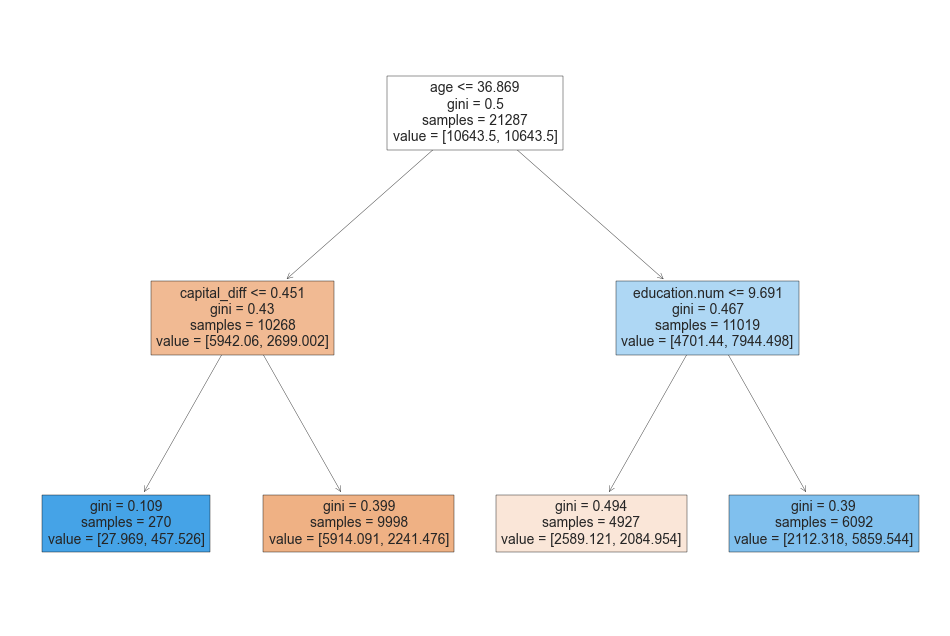

In [151]:
report_model(model_dt)
plt.show()

In [152]:
eval_metric(model_dt, X_train, y_train, X_test, y_test)

Test_Set
[[5483 1367]
 [ 856 1417]]
              precision    recall  f1-score   support

           0       0.86      0.80      0.83      6850
           1       0.51      0.62      0.56      2273

    accuracy                           0.76      9123
   macro avg       0.69      0.71      0.70      9123
weighted avg       0.78      0.76      0.76      9123


Train_Set
[[12769  3214]
 [ 2156  3148]]
              precision    recall  f1-score   support

           0       0.86      0.80      0.83     15983
           1       0.49      0.59      0.54      5304

    accuracy                           0.75     21287
   macro avg       0.68      0.70      0.68     21287
weighted avg       0.77      0.75      0.75     21287



Logistic Model

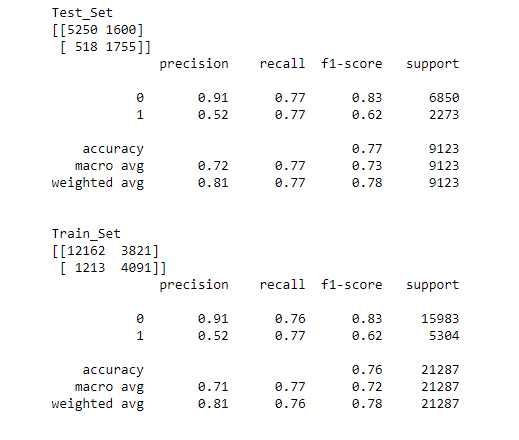

KNN Model

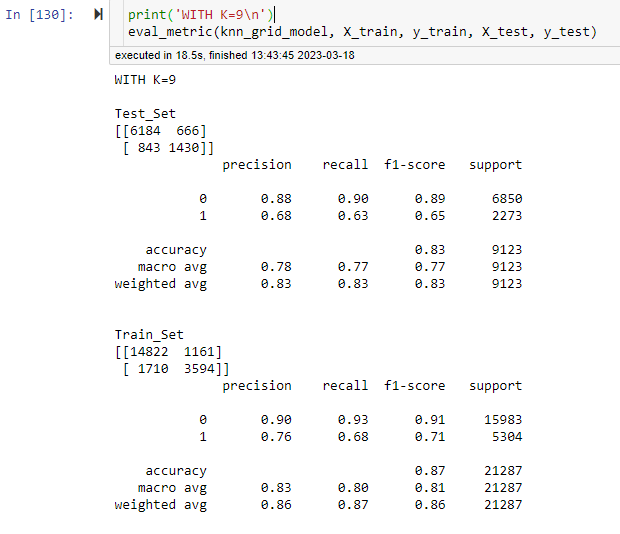

# Final Model and Predict

In [153]:
X= df.drop(columns="income")
y= df.income

In [154]:
categorical = ['workclass', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country', 'education', 'capital_diff']
label_encoder = LabelEncoder()

for feature in categorical:
    X[feature] = label_encoder.fit_transform(X[feature])

y = label_encoder.fit_transform(y)

In [155]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=9, p=1))]

final_model = Pipeline(steps=operations)

final_model.fit(X, y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=9, p=1))])

In [156]:
import pickle

In [157]:
pickle.dump(final_model, open('knn_final_model', 'wb'))

In [158]:
loaded_model = pickle.load(open('knn_final_model', 'rb'))

In [159]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
age,30410.0,38.528510,13.075332,17.0,28.0,37.0,47.0,90.0
workclass,30410.0,3.079744,1.107875,0.0,3.0,3.0,3.0,7.0
education,30410.0,4.768859,2.888072,0.0,3.0,5.0,6.0,9.0
education.num,30410.0,10.115390,2.558957,1.0,9.0,10.0,13.0,16.0
marital.status,30410.0,2.572871,1.496672,0.0,2.0,2.0,4.0,6.0
occupation,30410.0,5.933344,4.033101,0.0,2.0,6.0,9.0,13.0
relationship,30410.0,1.414173,1.604633,0.0,0.0,1.0,3.0,5.0
race,30410.0,1.802039,0.508867,0.0,2.0,2.0,2.0,2.0
sex,30410.0,0.678066,0.467225,0.0,0.0,1.0,1.0,1.0
hours.per.week,30410.0,41.422953,9.245775,20.0,40.0,40.0,45.0,72.0


In [160]:
new_obs = {"age": [65, 40],
           "workclass": [1,3],
           "education": [4,5],
           "education.num": [4,9],
           "marital.status": [2,2],
           "occupation": [1, 6],
           "relationship": [1, 0],
           "race": [0, 2],
           "sex": [0, 1],
           "hours.per.week": [25,60],
           "native.country": [0,1],
           "capital_diff": [0.5,1]
          }

In [161]:
samples = pd.DataFrame(new_obs)
samples

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,capital_diff
0,65,1,4,4,2,1,1,0,0,25,0,0.5
1,40,3,5,9,2,6,0,2,1,60,1,1.0


In [162]:
predictions = loaded_model.predict(samples)
predictions_proba = loaded_model.predict_proba(samples)

In [163]:
samples["pred"] = predictions
samples["pred_proba_1"] = predictions_proba[:,1]
samples["pred_proba_0"] = predictions_proba[:,0]
samples

,age,workclass,education,education.num,marital.status,occupation,relationship,race,sex,hours.per.week,native.country,capital_diff,pred,pred_proba_1,pred_proba_0
0,65,1,4,4,2,1,1,0,0,25,0,0.5,0,0.000000,1.000000
1,40,3,5,9,2,6,0,2,1,60,1,1.0,1,0.555556,0.444444
